### Imports

In [29]:
# General
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import re
from tqdm import tqdm
import plotly.graph_objects as go
import plotly.express as px
import capir_transfronteriza2_2023.data.load as load

# Topic modeling
from sentence_transformers import SentenceTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.feature_extraction.text import TfidfVectorizer
from umap import UMAP
from sklearn.cluster import KMeans
from hdbscan import HDBSCAN

### Load data

In [30]:
data_processed = load.data_processed
assets = load.assets

### Read data from Ecuador

In [31]:
data = pd.read_csv(f"{data_processed}/ecuador.csv")

print(data.shape)

data.head(3)

(34693, 4)


,user_screen_name,country,text,text_clean
0,etorrescobo,Ecuador,"Juan Carlos, pero si atrás del video están ust...","Juan Carlos, pero si atrás del video están ust..."
1,etorrescobo,Ecuador,@ViTTO095 @AndresSeminario Se les escapó entre...,$MENTION$ $MENTION$ Se les escapó entre chisme...
2,etorrescobo,Ecuador,Solidaridad con @LeninArtieda y con @ecuavisa....,Solidaridad con $MENTION$ y con $MENTION$. Imp...


### Process data

In [32]:
country = data[data['text_clean'].apply(lambda x: isinstance(x, (str, bytes)))]

country['text_cluster'] = country['text'].apply(lambda x: x.replace('\n',''))

print(country.shape)

(34573, 5)


/tmp/ipykernel_56168/1630503326.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### Create embeddings

In [33]:
# Load model to generate embeddings
sbert_model = SentenceTransformer('all-MiniLM-L6-v2')

In [34]:
# Process data with encoder
vecs = sbert_model.encode(country["text_clean"].values)

In [35]:
# Apply the dimensionality reduction process.

# Scaler to normalize data
scaler = StandardScaler()
# PCA to reduce multicollinearity and noise
pca_ = PCA(0.9, random_state=5)
# UMAP to reduce dimensionality to two components
umap_ = UMAP(n_components=2,
             random_state=5,
             metric="cosine",
             n_neighbors=50,
             min_dist=0.1)

vecs_sc = scaler.fit_transform(vecs)
vecs_pca = pca_.fit_transform(vecs_sc)
vecs_umap = umap_.fit_transform(vecs_pca)

In [36]:
# Assign components to dataset
country.loc[:,"COMP_1"] = vecs_umap[:,0]
country.loc[:,"COMP_2"] = vecs_umap[:,1]

# Show data
country.head()

/tmp/ipykernel_56168/4075971638.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_56168/4075971638.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,user_screen_name,country,text,text_clean,text_cluster,COMP_1,COMP_2
0,etorrescobo,Ecuador,"Juan Carlos, pero si atrás del video están ust...","Juan Carlos, pero si atrás del video están ust...","Juan Carlos, pero si atrás del video están ust...",6.925628,9.224609
1,etorrescobo,Ecuador,@ViTTO095 @AndresSeminario Se les escapó entre...,$MENTION$ $MENTION$ Se les escapó entre chisme...,@ViTTO095 @AndresSeminario Se les escapó entre...,7.030454,7.164153
2,etorrescobo,Ecuador,Solidaridad con @LeninArtieda y con @ecuavisa....,Solidaridad con $MENTION$ y con $MENTION$. Imp...,Solidaridad con @LeninArtieda y con @ecuavisa....,8.251235,4.659515
3,etorrescobo,Ecuador,Fuerza Ecuador. « MoniVelasquezV: 🔴 Te salvé y...,Fuerza Ecuador. « MoniVelasquezV: :red_circle:...,Fuerza Ecuador. « MoniVelasquezV: 🔴 Te salvé y...,5.924327,8.702713
4,etorrescobo,Ecuador,Luchito fue para la Asamblea Nacional casi com...,Luchito fue para la Asamblea Nacional casi com...,Luchito fue para la Asamblea Nacional casi com...,7.050543,8.205220


In [37]:
# Visualize the distribution of embeddings with a hover to see the tweets.
fig = px.scatter(
    country,
    x="COMP_1",
    y="COMP_2",
    hover_data=["user_screen_name", "text_clean"])
fig.write_html(f"{assets}/ecuador/ecuador.html")
fig.show()

### Clustering

In [38]:
# Apply the HDBSCAN algorithm to extract the clusters.

mc_size = 89
m_samples = 1

db_model = HDBSCAN(min_cluster_size=mc_size,
                   min_samples=m_samples,
                   metric="euclidean", 
                   )
db_model.fit(country.loc[:,["COMP_1", "COMP_2"]])
country.loc[:, "CLUSTER"] = db_model.labels_
country.loc[:, "PROBA"] = db_model.probabilities_

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

/tmp/ipykernel_56168/544355622.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_56168/544355622.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



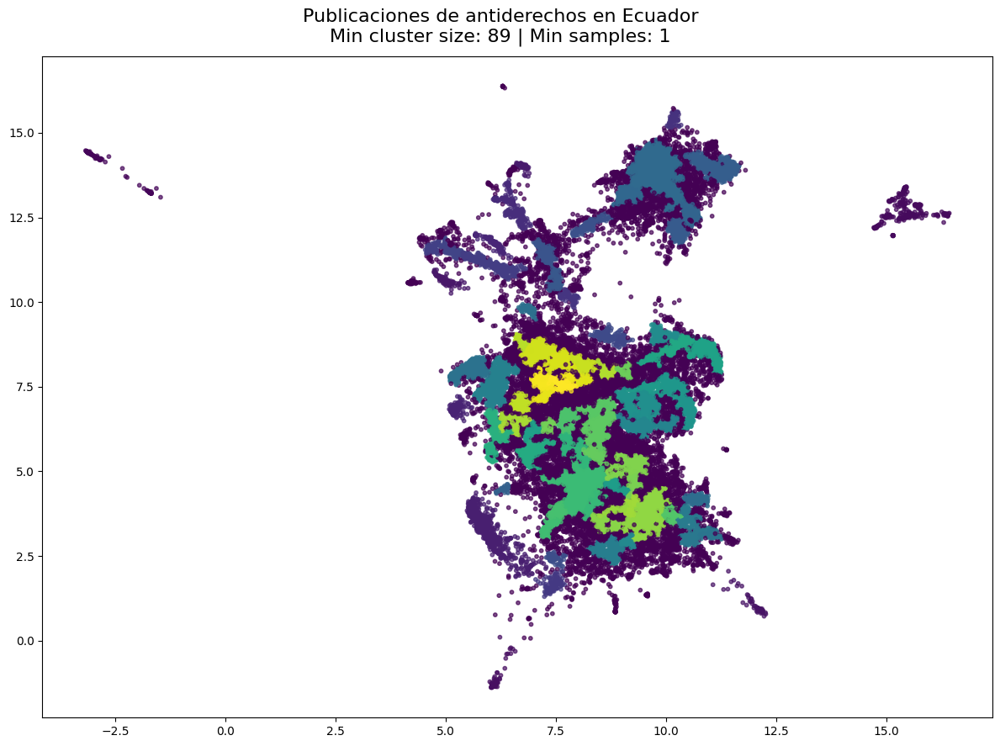

In [39]:
# Visualize clusters
plt.figure(figsize=(12,9))
plt.scatter(vecs_umap[:,0], vecs_umap[:,1], alpha=0.7, c=db_model.labels_, s=10)
plt.suptitle(f"Publicaciones de antiderechos en Ecuador\nMin cluster size: {mc_size} | Min samples: {m_samples}", fontsize=16)
plt.tight_layout()
plt.savefig(f"{assets}/ecuador/ecuador_clusters")
plt.show()

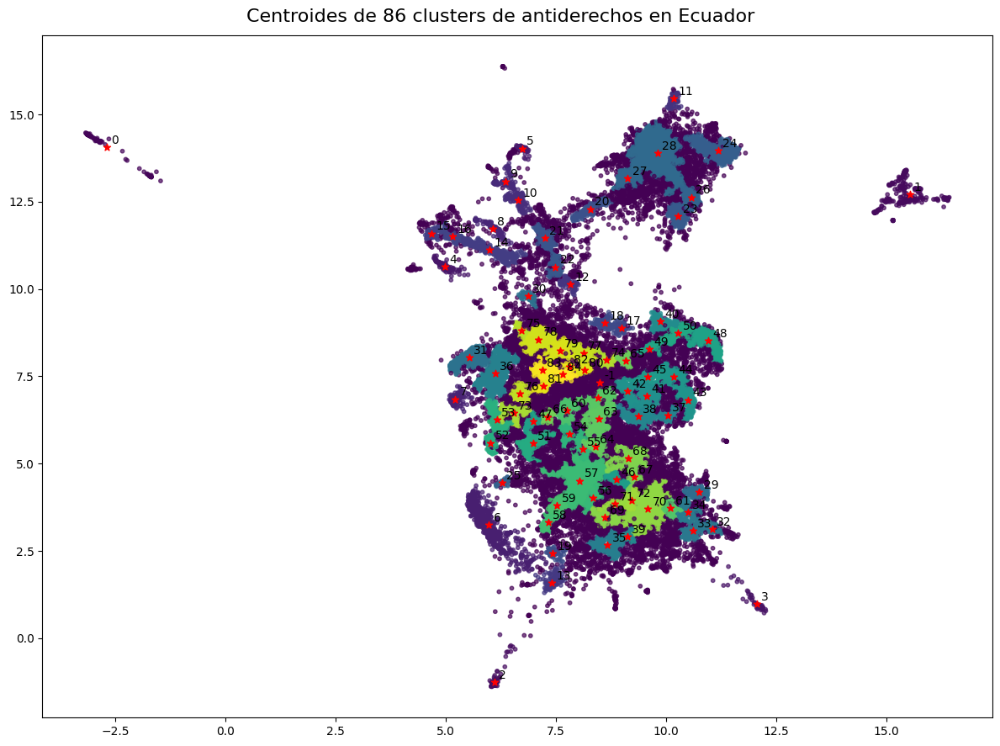

In [40]:
# Extract the centroid of each cluster

cl_centroids = {}

for i in sorted(country["CLUSTER"].unique()):

  cl_centroids[i] = country[country["CLUSTER"] == i][["COMP_1", "COMP_2"]].mean().values

centroids_array = np.array(list(cl_centroids.values()))

fig, ax = plt.subplots(figsize=(12,9))
ax.scatter(vecs_umap[:,0], vecs_umap[:,1], s=10, alpha=0.7, c=db_model.labels_)
ax.scatter(centroids_array[:,0], centroids_array[:,1], marker="*", c="red")
for i in cl_centroids:
  ax.annotate(i, cl_centroids.get(i)+np.array([0.1, 0.1]))
plt.suptitle(f"Centroides de {len(cl_centroids)} clusters de antiderechos en Ecuador", fontsize=16)
plt.tight_layout()
plt.savefig(f"{assets}/ecuador/ecuador_centroids", dpi=fig.dpi)
plt.show()

In [41]:
from sklearn.metrics.pairwise import euclidean_distances

N = 20

with open(f"{assets}/ecuador/ecuador.txt", 'w') as f:
  for i in cl_centroids:
    point = cl_centroids.get(i).reshape(1,-1)
    ix_min_dist = np.argsort(euclidean_distances(point, country.loc[:, ["COMP_1", "COMP_2"]])).flatten()[:N]
    print(f"\n[Tweets más representativos del cluster {i}]", file=f)
    users = country.iloc[ix_min_dist, country.columns.get_loc("user_screen_name")].values
    texts = country.iloc[ix_min_dist, country.columns.get_loc("text_cluster")].values
    tweets = [[x, y] for x, y in zip(users, texts)]
    print('\n'.join([': '.join(map(str, inner_list)) for inner_list in tweets]), file=f)